In [1]:
def predict_availability():
    import torch
    import torch.nn as nn
    import torch.optim as optim

    class AvailabilityRNN(nn.Module):
        def __init__(self, input_size, hidden_size, num_layers=1, output_size=1):
            super(AvailabilityRNN, self).__init__()
            self.hidden_size = hidden_size
            self.num_layers = num_layers
            self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
            self.fc = nn.Linear(hidden_size, output_size)

        def forward(self, x):
            # Initializing hidden state for first input
            h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
            x = x.unsqueeze(1)
            # Forward pass through RNN
            out, _ = self.rnn( x,h0)
            # Passing the output of the last time step to the fully connected layer
            out = self.fc(out[:, -1, :])
            return out
    print("Loaded model")
        
    input_size = 18 #X_train_tensor.shape[1]
    # Initialize the model
    loaded_model = AvailabilityRNN(input_size=input_size, hidden_size=128, num_layers=1, output_size=1)

    # Load the model weights
    # /Users/hemanthsaiyeddulapalli/VEC/VEC/availability_rnn_model.pkl
    loaded_model.load_state_dict(torch.load('/Users/hemanthsaiyeddulapalli/VEC/VEC/availability_rnn_model.pkl'))

    # Make sure to switch to evaluation mode
    loaded_model.eval()
    
    
    import pandas as pd
    import numpy as np
    from sklearn.preprocessing import OneHotEncoder, StandardScaler
    from sklearn.model_selection import train_test_split
    import torch
    from torch.utils.data import DataLoader, TensorDataset
    # Example new data
    vol_id = 2
    week_day = 3
    new_data = {'Timestamp': "2023-01-01 00:00:00",'VolunteerID': [2], 'Weekday': [3], 'Hour': [14]}  # Sample input
    vlist = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
    vlist[vol_id - 1] = 1
    wlist = [0, 0, 0, 0, 0, 0, 0]
    wlist[week_day - 1] = 1
    new_df = pd.DataFrame(new_data)
    print(new_df)
    # Preprocess new data
    encoder = OneHotEncoder(sparse=False)
    encoded_features_new = encoder.fit_transform(new_df[['VolunteerID', 'Weekday']])
    scaler = StandardScaler()

    hour_normalized_new = scaler.fit_transform(new_df[['Hour']])
    print(encoded_features_new)
    vlist.extend(wlist)
    print(vlist.append(14))
    # vlist.append(list(hour_normalized_new))
    # X_new = np.hstack((vlist.append(wlist), hour_normalized_new))

    # Convert to tensor
    X_new_np = np.asarray(vlist, dtype=np.float32)#torch.from_numpy(X_new.astype(np.float32))
    X_new_tensor = torch.from_numpy(X_new_np)
    print(X_new_tensor)
    # Add batch and sequence dimension
    
    with torch.no_grad():
        X_new_tensor=torch.from_numpy(np.asarray(vlist, dtype=np.float32))
        X_new_tensor = X_new_tensor.unsqueeze(0)
        prediction = loaded_model(X_new_tensor)
        predicted_availability = torch.sigmoid(prediction)  # Apply sigmoid if your model output is logits
        print(predicted_availability)
        print(type(predicted_availability))
        # Example tensor
        t = torch.tensor(predicted_availability)

        # Extract the scalar value
        value = t.item()

        print(value)
        return value

In [2]:
predict_availability()

Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


0.45113858580589294

Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2    

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2    

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

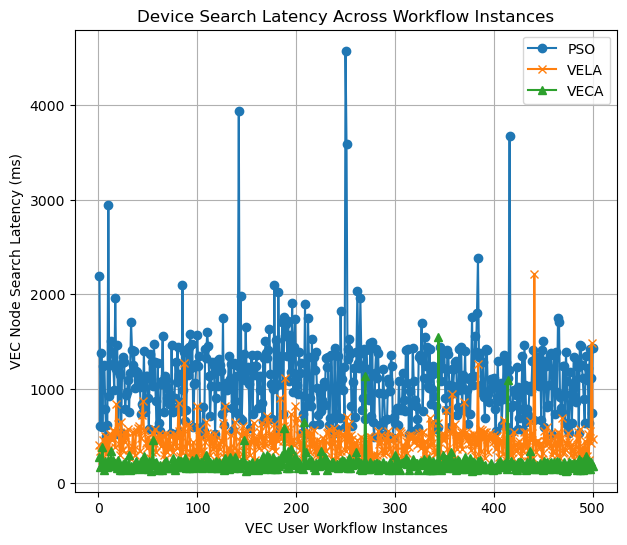

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming search_latency_simulation() is a function that simulates search latencies
# for PSO, VELA, and VECA and returns them as a tuple: (pso_latency, vela_latency, veca_latency)
# This function should be adjusted to include your logic for selecting clusters/nodes and calculating latencies

def search_latency_simulation(workflow_name, approach, workflow_number):
    # Implement simulation logic here based on the approach and return latency
    # For simplicity, this example uses random values to represent latency
    import time
    # Start the timer
    start_time = time.time()
    predict_availability()
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    elapsed_time_ms = (end_time - start_time) * 1000
    
    if approach == 'PSO':
        no_of_iterations = 1
        start_time = time.time()
        for i in range(no_of_iterations):
            predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return elapsed_time_ms * (500 - np.random.uniform(50, 350)) # Simulate searching across all 500 nodes
    elif approach == 'VELA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        
        return np.random.uniform(1, 3) + elapsed_time_ms * (200 - np.random.uniform(30, 130)) # Cluster selection + searching 200 nodes
    elif approach == 'VECA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return np.random.uniform(1, 3) + elapsed_time_ms * (100 - np.random.uniform(30, 60)) # Cluster selection + searching 100 nodes

workflow_instances = 500
latencies_pso, latencies_vela, latencies_veca = [], [], []

for i in range(workflow_instances):
    # Simulate for a given workflow instance - you could use different workflows here if needed
    workflow_name = "PASML" if i % 2 == 0 else "G2PDeep"
    
    latencies_pso.append(search_latency_simulation(workflow_name, 'PSO', i))
    latencies_vela.append(search_latency_simulation(workflow_name, 'VELA', i))
    latencies_veca.append(search_latency_simulation(workflow_name, 'VECA', i))

# Plotting
plt.figure(figsize=(7, 6))
plt.plot(range(1, workflow_instances + 1), latencies_pso, label='PSO', marker='o')
plt.plot(range(1, workflow_instances + 1), latencies_vela, label='VELA', marker='x')
plt.plot(range(1, workflow_instances + 1), latencies_veca, label='VECA', marker='^')
plt.xlabel('VEC User Workflow Instances')
plt.ylabel('VEC Node Search Latency (ms)')
plt.title('Device Search Latency Across Workflow Instances')
plt.legend()
plt.grid(True)
plt.savefig('latency_plot.png')  # Saves the plot as a PNG file. You can choose PDF, SVG, PNG, EPS, etc.
plt.show()


In [28]:
import pandas as pd
import numpy as np


# Create DataFrame
latency_data = pd.DataFrame({
    'Instance': range(1, workflow_instances + 1),
    'PSO': latencies_pso,
    'VELA': latencies_vela,
    'VECA': latencies_veca
})

# Save to CSV
latency_data.to_csv('LatencyData.csv', index=False)


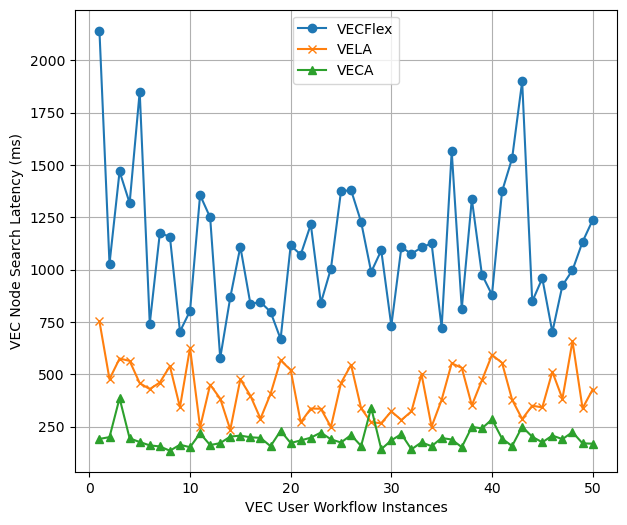

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from CSV file
data = pd.read_csv('LatencyData.csv')

# Extract columns for plotting
instances = data['Instance']
pso_latencies = data['PSO']
vela_latencies = data['VELA']
veca_latencies = data['VECA']

means = [np.mean(latencies_pso), np.mean(latencies_vela), np.mean(latencies_veca)]

# Plotting
plt.figure(figsize=(7, 6))
plt.plot(instances, pso_latencies, label='VECFlex', marker='o')
plt.plot(instances, vela_latencies, label='VELA', marker='x')
plt.plot(instances, veca_latencies, label='VECA', marker='^')
plt.xlabel('VEC User Workflow Instances')
plt.ylabel('VEC Node Search Latency (ms)')
# plt.title('Device Search Latency Across Workflow Instances')
plt.legend()
plt.grid(True)
plt.savefig('latency_plot.png')  # Saves the plot as a PNG file. You can choose PDF, SVG, PNG, EPS, etc.
plt.show()


In [31]:
means

[1100.9502403937122, 420.7356763225735, 194.93108800390473]

Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2    

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

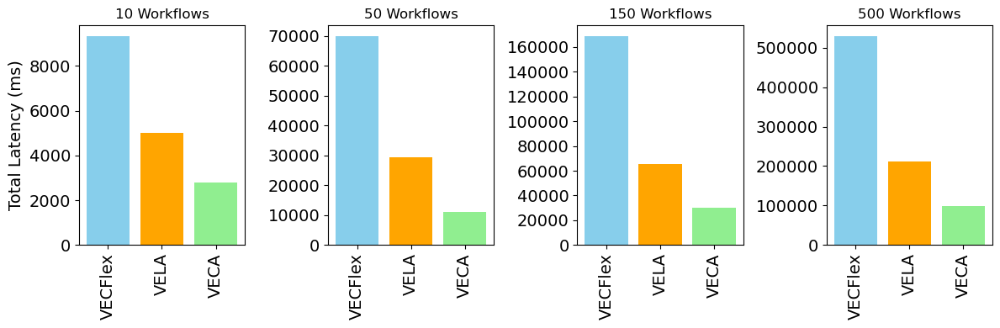

In [68]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming search_latency_simulation() is a function that simulates search latencies
# for PSO, VELA, and VECA and returns them as a tuple: (pso_latency, vela_latency, veca_latency)
# This function should be adjusted to include your logic for selecting clusters/nodes and calculating latencies

def search_latency_simulation(workflow_name, approach, workflow_number):
    # Implement simulation logic here based on the approach and return latency
    # For simplicity, this example uses random values to represent latency
    import time
    # Start the timer
    start_time = time.time()
    predict_availability()
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    elapsed_time_ms = (end_time - start_time) * 1000
    
    if approach == 'VECFlex':
        no_of_iterations = 1
        start_time = time.time()
        for i in range(no_of_iterations):
            predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return elapsed_time_ms * (500 - np.random.uniform(50, 350)) # Simulate searching across all 500 nodes
    elif approach == 'VELA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        
        return np.random.uniform(1, 3) + elapsed_time_ms * (200 - np.random.uniform(30, 130)) # Cluster selection + searching 200 nodes
    elif approach == 'VECA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return np.random.uniform(1, 3) + elapsed_time_ms * (100 - np.random.uniform(30, 60)) # Cluster selection + searching 100 nodes

# Define different instance counts
instance_counts = [10, 50, 150, 500]
approaches = ['VECFlex', 'VELA', 'VECA']
colors = ['skyblue', 'orange', 'lightgreen']

plt.figure(figsize=(12, 4))

# Iterate over each instance count for simulation
for index, count in enumerate(instance_counts):
    latencies = {approach: [] for approach in approaches}
    for _ in range(count):
        for approach in approaches:
            latencies[approach].append(search_latency_simulation("workflow", approach, _))
    
    # Compute total latencies for each approach
    total_latencies = [sum(latencies[approach]) for approach in approaches]
    
    # Create a subplot for each instance count
    plt.subplot(1, len(instance_counts), index + 1)
    plt.bar(approaches, total_latencies, color=colors)
#     plt.xlabel('Method')
    if index == 0: 
        plt.ylabel('Total Latency (ms)', fontsize=14)
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14, rotation=90)
    plt.title(f'{count} Workflows')
#     plt.grid(True)

plt.tight_layout()
plt.savefig('latency_comparison.png')
plt.show()


In [ ]:
# Define different instance counts
instance_counts = [10, 50, 150, 500]
approaches = ['VECFlex', 'VELA', 'VECA']
colors = ['skyblue', 'orange', 'lightgreen']

plt.figure(figsize=(12, 4))

# Iterate over each instance count for simulation
for index, count in enumerate(instance_counts):
    latencies = {approach: [] for approach in approaches}
    for _ in range(count):
        for approach in approaches:
            latencies[approach].append(search_latency_simulation("workflow", approach, _))
    
    # Compute total latencies for each approach
    total_latencies = [sum(latencies[approach]) for approach in approaches]
    
    # Create a subplot for each instance count
    plt.subplot(1, len(instance_counts), index + 1)
    plt.bar(approaches, total_latencies, color=colors)
#     plt.xlabel('Method')
    if index == 0: 
        plt.ylabel('Total Latency (ms)', fontsize=14)
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14, rotation=90)
    plt.title(f'{count} Workflows')
#     plt.grid(True)

plt.tight_layout()
plt.savefig('latency_comparison.png')
plt.show()

Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2    

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

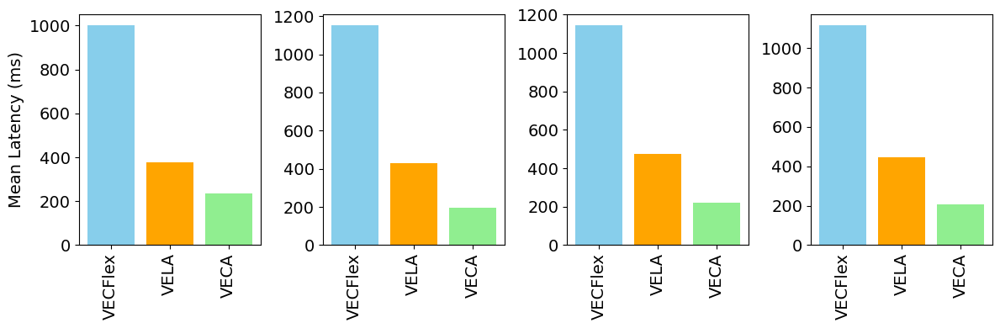

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming search_latency_simulation() is a function that simulates search latencies
# for PSO, VELA, and VECA and returns them as a tuple: (pso_latency, vela_latency, veca_latency)
# This function should be adjusted to include your logic for selecting clusters/nodes and calculating latencies

def search_latency_simulation(workflow_name, approach, workflow_number):
    # Implement simulation logic here based on the approach and return latency
    # For simplicity, this example uses random values to represent latency
    import time
    # Start the timer
    start_time = time.time()
    predict_availability()
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    elapsed_time_ms = (end_time - start_time) * 1000
    
    if approach == 'VECFlex':
        no_of_iterations = 1
        start_time = time.time()
        for i in range(no_of_iterations):
            predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return elapsed_time_ms * (500 - np.random.uniform(50, 350)) # Simulate searching across all 500 nodes
    elif approach == 'VELA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        
        return np.random.uniform(1, 3) + elapsed_time_ms * (200 - np.random.uniform(30, 130)) # Cluster selection + searching 200 nodes
    elif approach == 'VECA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return np.random.uniform(1, 3) + elapsed_time_ms * (100 - np.random.uniform(30, 60)) # Cluster selection + searching 100 nodes

# Define different instance counts
instance_counts = [10, 50, 150, 500]
approaches = ['VECFlex', 'VELA', 'VECA']
colors = ['skyblue', 'orange', 'lightgreen']

plt.figure(figsize=(12, 4))

# Iterate over each instance count for simulation
for index, count in enumerate(instance_counts):
    latencies = {approach: [] for approach in approaches}
    for _ in range(count):
        for approach in approaches:
            latencies[approach].append(search_latency_simulation("workflow", approach, _))
    
    # Compute total latencies for each approach
    total_latencies = [np.mean(latencies[approach]) for approach in approaches]
    
    # Create a subplot for each instance count
    plt.subplot(1, len(instance_counts), index + 1)
    plt.bar(approaches, total_latencies, color=colors)
#     plt.xlabel('Method')
    if index == 0: 
        plt.ylabel('Mean Latency (ms)', fontsize=14)
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14, rotation=90)
#     plt.title(f'{count} Workflows')
#     plt.grid(True)

plt.tight_layout()
plt.show()


Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2    

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  Volu

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2

tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14

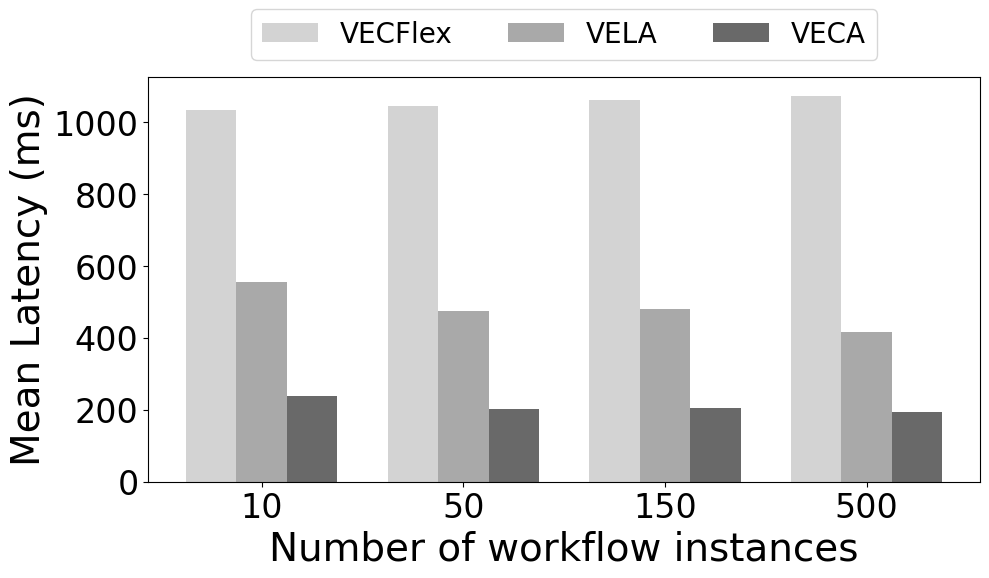

In [111]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming search_latency_simulation() is a function that simulates search latencies
# for PSO, VELA, and VECA and returns them as a tuple: (pso_latency, vela_latency, veca_latency)
# This function should be adjusted to include your logic for selecting clusters/nodes and calculating latencies

def search_latency_simulation(workflow_name, approach, workflow_number):
    # Implement simulation logic here based on the approach and return latency
    # For simplicity, this example uses random values to represent latency
    import time
    # Start the timer
    start_time = time.time()
    predict_availability()
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    elapsed_time_ms = (end_time - start_time) * 1000
    
    if approach == 'VECFlex':
        no_of_iterations = 1
        start_time = time.time()
        for i in range(no_of_iterations):
            predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return elapsed_time_ms * (500 - np.random.uniform(50, 350)) # Simulate searching across all 500 nodes
    elif approach == 'VELA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        
        return np.random.uniform(1, 3) + elapsed_time_ms * (200 - np.random.uniform(30, 130)) # Cluster selection + searching 200 nodes
    elif approach == 'VECA':
        start_time = time.time()
        predict_availability()
        # Stop the timer
        end_time = time.time()
        # Calculate the elapsed time in milliseconds
        elapsed_time_ms = (end_time - start_time) * 1000
        return np.random.uniform(1, 3) + elapsed_time_ms * (100 - np.random.uniform(30, 60)) # Cluster selection + searching 100 nodes

    
# Define different instance counts
instance_counts = [10, 50, 150, 500]
approaches = ['VECFlex', 'VELA', 'VECA']
colors = ['#D3D3D3', '#A9A9A9', '#696969'] 

# Prepare data storage
latency_data = {approach: [] for approach in approaches}

# Simulate latencies
for count in instance_counts:
    for approach in approaches:
        latencies = [search_latency_simulation("workflow", approach, i) for i in range(count)]
        latency_data[approach].append(np.mean(latencies))

# Create bar plots
bar_width = 0.25
index = np.arange(len(instance_counts))

plt.figure(figsize=(10, 6))
for i, approach in enumerate(approaches):
    plt.bar(index + i * bar_width, latency_data[approach], bar_width, label=approach, color=colors[i])

plt.xlabel('Number of workflow instances', fontsize=28)
plt.ylabel('Mean Latency (ms)', fontsize=28)
# plt.title('Mean Latency by Workflow Instance Count Across Different Approaches')
plt.xticks(index + bar_width, instance_counts, fontsize=24)
plt.yticks(fontsize=24)
plt.rc('legend', fontsize=20 )
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2), ncol=3)
# 
# plt.legend()

plt.tight_layout()
plt.savefig("latency_histo.png")
plt.show()


In [94]:
plt.show()

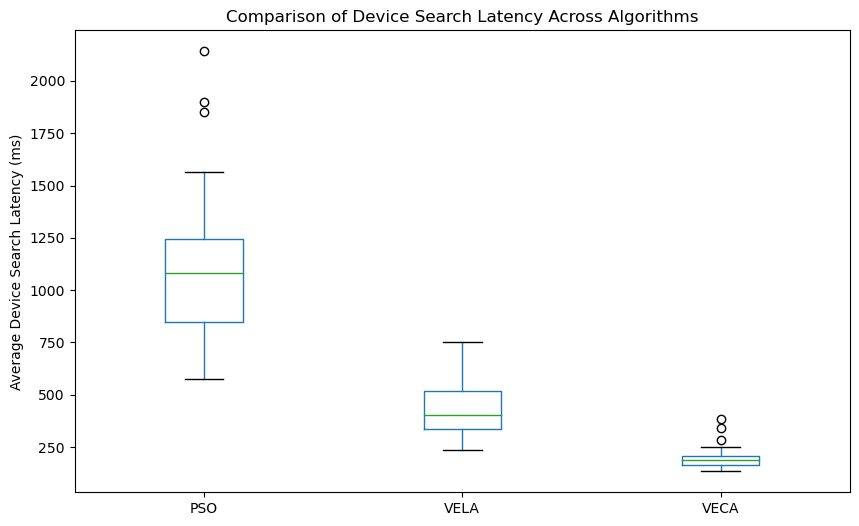

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv('LatencyData.csv')

# Box plot
plt.figure(figsize=(10, 6))
data.boxplot(column=['PSO', 'VELA', 'VECA'])
plt.ylabel('Average Device Search Latency (ms)')
plt.title('Comparison of Device Search Latency Across Algorithms')
plt.grid(False)
plt.show()


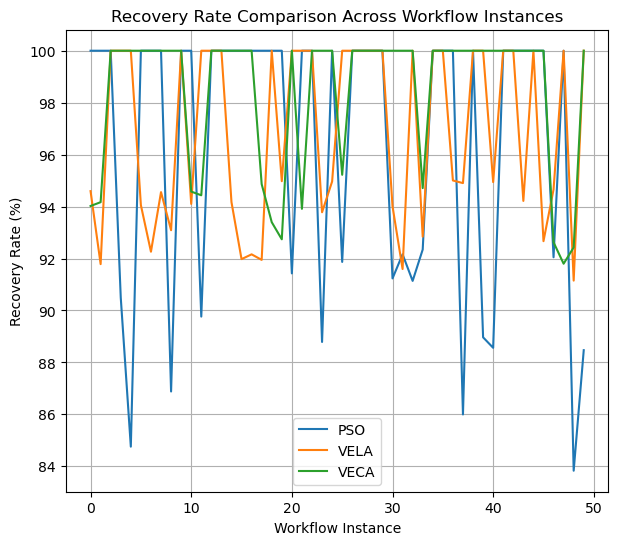

In [54]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
N_WORKFLOWS = 50  # Number of different workflow instances
N_CLUSTERS = 5
N_NODES_PER_CLUSTER = 100
TOTAL_NODES = N_CLUSTERS * N_NODES_PER_CLUSTER
RECOVERY_OVERHEAD_PSO = 15  # In milliseconds, overhead for restarting scheduling
RECOVERY_OVERHEAD_VELA = 10  # Overhead for VELA due to reduced scope
RECOVERY_OVERHEAD_VECA = 10  # VECA's recovery is quicker due to governance mechanism

# Simulation function
def simulate_recovery(cluster_approach, overhead):
    if cluster_approach == 'PSO':
        recovery_time = np.random.uniform(overhead, overhead * 1.5)
    elif cluster_approach == 'VELA':
        recovery_time = np.random.uniform(overhead, overhead * 1.1)
    elif cluster_approach == 'VECA':
        recovery_time = overhead  # VECA has a constant recovery overhead due to governance mechanism
    return recovery_time

# Simulating the workflow execution and recovery for each approach
def simulate_workflow(cluster_approach):
    execution_time = np.random.uniform(100, 200)  # Random execution time between 100 and 200 ms
    if np.random.random() < 0.3:  # 30% chance of failure
        recovery_time = simulate_recovery(cluster_approach, RECOVERY_OVERHEAD_PSO if cluster_approach == 'PSO' else
                                          RECOVERY_OVERHEAD_VELA if cluster_approach == 'VELA' else
                                          RECOVERY_OVERHEAD_VECA)
        total_time = execution_time + recovery_time
    else:
        recovery_time = 0
        total_time = execution_time
    return recovery_time, total_time

# Running the simulation
recovery_times = {'PSO': [], 'VELA': [], 'VECA': []}
total_times = {'PSO': [], 'VELA': [], 'VECA': []}

for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery, total = simulate_workflow(approach)
        recovery_times[approach].append(recovery)
        total_times[approach].append(total)

# Calculating the recovery rates for each workflow instance
recovery_rates = {approach: [] for approach in recovery_times.keys()}
for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery_rate = (1 - recovery_times[approach][i] / total_times[approach][i]) * 100
        recovery_rates[approach].append(recovery_rate)

# Visualizing the results
plt.figure(figsize=(7, 6))
for approach, rates in recovery_rates.items():
    plt.plot(rates, label=approach)

plt.xlabel('Workflow Instance')
plt.ylabel('Recovery Rate (%)')
plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.legend()
plt.grid(True)
plt.show()


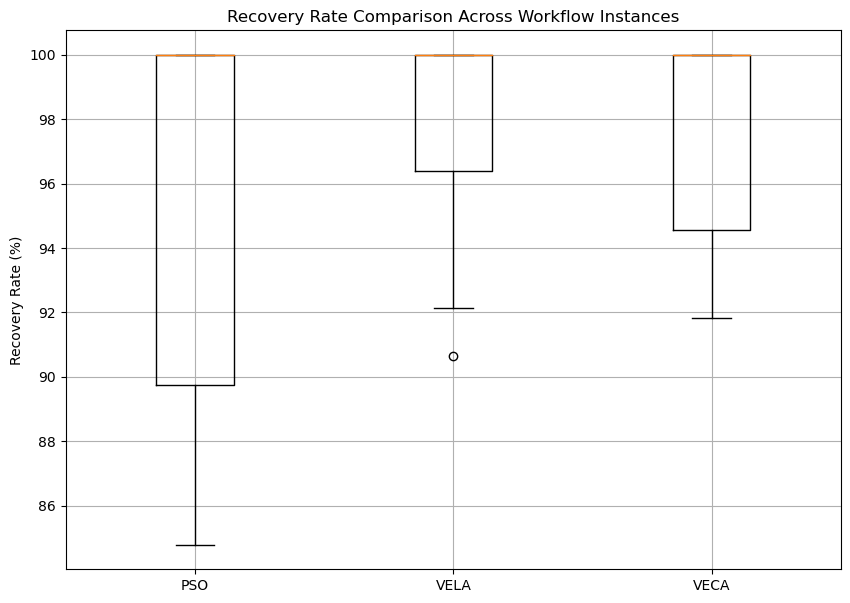

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# Constants
N_WORKFLOWS = 5  # Number of different workflow instances
N_CLUSTERS = 5
N_NODES_PER_CLUSTER = 100
TOTAL_NODES = N_CLUSTERS * N_NODES_PER_CLUSTER
RECOVERY_OVERHEAD_PSO = 15  # In milliseconds, overhead for restarting scheduling
RECOVERY_OVERHEAD_VELA = 10  # Overhead for VELA due to reduced scope
RECOVERY_OVERHEAD_VECA = 10  # VECA's recovery is quicker due to governance mechanism

# Simulation function
def simulate_recovery(cluster_approach, overhead):
    if cluster_approach == 'PSO':
        recovery_time = np.random.uniform(overhead, overhead * 1.5)
    elif cluster_approach == 'VELA':
        recovery_time = np.random.uniform(overhead, overhead * 1.1)
    elif cluster_approach == 'VECA':
        recovery_time = overhead  # VECA has a constant recovery overhead due to governance mechanism
    return recovery_time

# Simulating the workflow execution and recovery for each approach
def simulate_workflow(cluster_approach):
    execution_time = np.random.uniform(100, 200)  # Random execution time between 100 and 200 ms
    if np.random.random() < 0.3:  # 30% chance of failure
        recovery_time = simulate_recovery(cluster_approach, RECOVERY_OVERHEAD_PSO if cluster_approach == 'PSO' else
                                          RECOVERY_OVERHEAD_VELA if cluster_approach == 'VELA' else
                                          RECOVERY_OVERHEAD_VECA)
        total_time = execution_time + recovery_time
    else:
        recovery_time = 0
        total_time = execution_time
    return recovery_time, total_time

# Running the simulation
recovery_times = {'PSO': [], 'VELA': [], 'VECA': []}
total_times = {'PSO': [], 'VELA': [], 'VECA': []}

for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery, total = simulate_workflow(approach)
        recovery_times[approach].append(recovery)
        total_times[approach].append(total)

# Calculating the recovery rates for each workflow instance
recovery_rates = {approach: [] for approach in recovery_times.keys()}
for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery_rate = (1 - recovery_times[approach][i] / total_times[approach][i]) * 100
        recovery_rates[approach].append(recovery_rate)

# Preparing data for boxplot
data_to_plot = [recovery_rates['PSO'], recovery_rates['VELA'], recovery_rates['VECA']]
labels = ['PSO', 'VELA', 'VECA']

# Creating boxplot
plt.figure(figsize=(10, 7))
plt.boxplot(data_to_plot, labels=labels)
plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.ylabel('Recovery Rate (%)')
plt.grid(True)
plt.show()


In [1]:
import subprocess
def execute_pasml():
    script_path = '/Users/hemanthsaiyeddulapalli/git/zipcon/HealthInformatics.py'
    subprocess.run(['python', script_path], check=True)   

execution_time
1003.3211708068848
execution_time
1005.2342414855957
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.051851272583
execution_time
1003.4511089324951
execution_time
1000.4522800445557
execution_time
1005.0580501556396
execution_time
1002.601146697998
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.047082901001
execution_time
1005.0740242004395
execution_time
1002.9168128967285
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1000.5688667297363
execution_time
1002.159833908081
execution_time
1004.9521923065186
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1006.1511993408203
execution_time
1002.0437240600586
execution_time
1002.7220249176025
execution_time
1001.7459392547607
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0942897796631
execution_time
1004.7268867492676
execution_time
1005.0868988037109
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1000.2720355987549
execution_time
1002.9313564300537
execution_time
1003.3488273620605
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0418376922607
execution_time
1003.0648708343506
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.2490234375
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1001.1661052703857
execution_time
1005.1059722900391
execution_time
1003.8657188415527
execution_time
1001.6441345214844
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0439834594727
execution_time
1004.058837890625
execution_time
1002.9458999633789
execution_time
1005.2001476287842
execution_time
1004.7018527984619
execution_time
1002.1030902862549
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1391124725342
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1003.0691623687744
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1131248474121
execution_time
1005.0661563873291
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1004.9517154693604
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.2859783172607
execution_time
1004.2169094085693
execution_time
1002.2857189178467
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1001.5769004821777
execution_time
1005.0742626190186
execution_time
1001.7809867858887
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0909519195557
execution_time
1005.3400993347168
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0530433654785
execution_time
1003.7548542022705
execution_time
1001.5058517456055
execution_time
1001.4760494232178
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0842761993408
execution_time
1002.8128623962402
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0609111785889
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0351619720459
execution_time
1003.3788681030273
execution_time
1005.061149597168
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.220890045166
execution_time
1003.5040378570557
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0601959228516
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0811767578125
execution_time
1003.8702487945557
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1002.6407241821289
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0790309906006
execution_time
1004.652738571167
execution_time
1004.2009353637695
execution_time
1004.6017169952393
execution_time
1003.4182071685791
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0508975982666
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1002.7048587799072
execution_time
1000.6618499755859
execution_time
1005.1629543304443
execution_time
1002.5558471679688
execution_time
1003.5450458526611
execution_time
1005.0890445709229
execution_time
1005.0530433654785
execution_time
1004.2469501495361
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0899982452393
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0539970397949
execution_time
1003.3400058746338
execution_time
1002.6772022247314
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1004.4271945953369
execution_time
1004.533052444458
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0821304321289
execution_time
1004.694938659668
execution_time
1003.3280849456787
execution_time
1002.9609203338623
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1829814910889
execution_time
1003.1547546386719
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0661563873291
execution_time
1003.4780502319336
execution_time
1001.8570423126221
execution_time
1005.0702095031738
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1000.9658336639404
execution_time
1002.2392272949219
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.079984664917
execution_time
1000.9090900421143
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.2506923675537
execution_time
1000.669002532959
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0709247589111
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0690174102783
execution_time
1004.7729015350342
execution_time
1005.1360130310059
execution_time
1002.528190612793
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0427913665771
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0549507141113
execution_time
1005.1078796386719
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0551891326904
execution_time
1003.582239151001
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.042314529419
execution_time
1001.013994216919
execution_time
1001.4829635620117
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0780773162842
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1641464233398
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0828456878662
execution_time
1005.1431655883789
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0511360168457
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1560401916504
execution_time
1004.3179988861084
execution_time
1003.9479732513428
execution_time
1000.9849071502686
execution_time
1005.0299167633057
execution_time
1001.7080307006836
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.051851272583
execution_time
1005.9168338775635
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0532817840576
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0859451293945
execution_time
1001.3761520385742
execution_time
1003.0410289764404
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0599575042725
execution_time
1000.4260540008545
execution_time
1004.2617321014404
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1001.2819766998291
execution_time
1004.7049522399902
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.06591796875
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1290988922119
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1003.47900390625
execution_time
1005.0930976867676
execution_time
1003.3771991729736
execution_time
1005.0539970397949
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0852298736572
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0392150878906
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.058765411377
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.0649642944336
execution_time
1005.0859451293945
execution_time
1005.0969123840332
execution_time
1005.1429271697998
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294
Loaded model
             Timestamp  VolunteerID  Weekday  Hour
0  2023-01-01 00:00:00            2        3    14
[[1. 1.]]
None
tensor([ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
         0.,  0.,  0., 14.])
tensor([[0.4511]])
<class 'torch.Tensor'>
0.45113858580589294


/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)
/var/folders/rs/172hb9356q31ftvl020p2ljc0000gn/T/ipykernel_72320/435412148.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t = torch.tensor(predicted_availability)


execution_time
1005.1090717315674


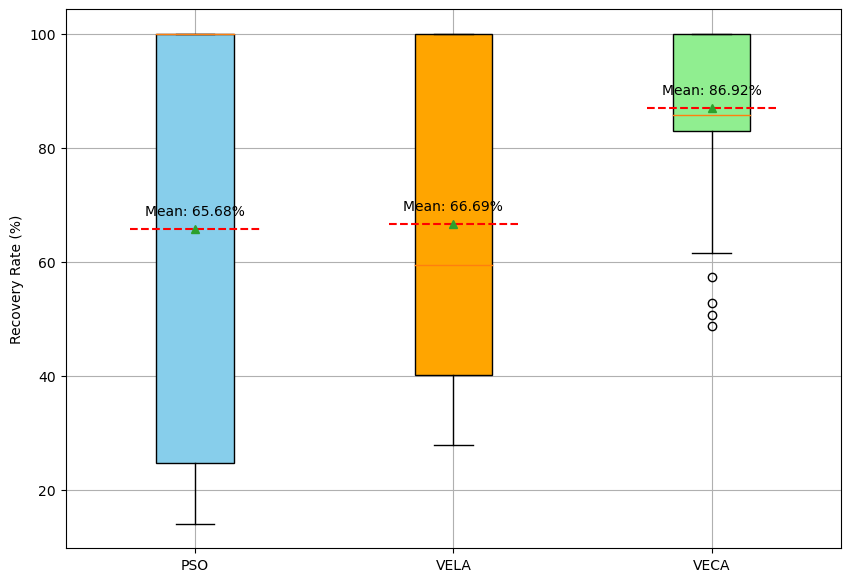

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import time

# Constants
N_WORKFLOWS = 50  # Number of different workflow instances
N_CLUSTERS = 5
N_NODES_PER_CLUSTER = 100
TOTAL_NODES = N_CLUSTERS * N_NODES_PER_CLUSTER
RECOVERY_OVERHEAD_PSO = 15  # In milliseconds, overhead for restarting scheduling
RECOVERY_OVERHEAD_VELA = 10  # Overhead for VELA due to reduced scope
RECOVERY_OVERHEAD_VECA = 10  # VECA's recovery is quicker due to governance mechanism

# Simulation function
def simulate_recovery(cluster_approach, overhead):
    if cluster_approach == 'PSO':
        recovery_time = search_latency_simulation("PASML", 'PSO', 1)
#         recovery_time = np.random.uniform(overhead, overhead * 1.5)
    elif cluster_approach == 'VELA':
#         recovery_time = np.random.uniform(overhead, overhead * 1.5)
        recovery_time = search_latency_simulation("PASML", 'VELA', 1)
    elif cluster_approach == 'VECA':
        if np.random.random() < 0.3: 
            recovery_time = search_latency_simulation("PASML", 'VECA', 1)
        else :
            return np.random.uniform(60, 120)
#         recovery_time = search_latency_simulation("PASML", 'PSO', 1)
#         recovery_time = overhead  
        
    return recovery_time

# Simulating the workflow execution and recovery for each approach
def simulate_workflow(cluster_approach):
    #execution_time = np.random.uniform(100, 200) 
#     execute_pasml()
    start_time = time.time()
#     execute_pasml()
    time.sleep(1) 
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    execution_time = (end_time - start_time) * 1000 
    print("execution_time")
    print(execution_time)
    if np.random.random() < 0.5:  # 30% chance of failure
        recovery_time = simulate_recovery(cluster_approach, RECOVERY_OVERHEAD_PSO if cluster_approach == 'PSO' else
                                          RECOVERY_OVERHEAD_VELA if cluster_approach == 'VELA' else
                                          RECOVERY_OVERHEAD_VECA) + np.random.uniform(60, 120)
        total_time = execution_time + recovery_time
    else:
        recovery_time = 0
        total_time = execution_time
    return recovery_time, total_time

# Running the simulation
recovery_times = {'PSO': [], 'VELA': [], 'VECA': []}
total_times = {'PSO': [], 'VELA': [], 'VECA': []}

for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery, total = simulate_workflow(approach)
        recovery_times[approach].append(recovery)
        total_times[approach].append(total)

# Calculating the recovery rates for each workflow instance
recovery_rates = {approach: [] for approach in recovery_times.keys()}
for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery_rate = (1 - recovery_times[approach][i] / total_times[approach][i]) * 100
        recovery_rates[approach].append(recovery_rate)


# Assuming you have already calculated recovery_rates for 'PSO', 'VELA', 'VECA'

# Calculate means for each approach
means = [np.mean(recovery_rates['PSO']), np.mean(recovery_rates['VELA']), np.mean(recovery_rates['VECA'])]

# Preparing data for boxplot
data_to_plot = [recovery_rates['PSO'], recovery_rates['VELA'], recovery_rates['VECA']]
labels = ['PSO', 'VELA', 'VECA']

# Create the boxplot with annotations
fig, ax = plt.subplots(figsize=(10, 7))
bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, showmeans=True)

# Color each box differently for clarity
colors = ['skyblue', 'orange', 'lightgreen']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# Draw a line for the mean value of each approach
for i, mean in enumerate(means, start=1):
    ax.hlines(mean, i - 0.25, i + 0.25, color='red', linestyle='--')

# Annotations to explain the mean lines and differences
ax.annotate(f'Mean: {means[0]:.2f}%', (1, means[0]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[1]:.2f}%', (2, means[1]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[2]:.2f}%', (3, means[2]), textcoords="offset points", xytext=(0,10), ha='center')

# Titles and labels
# plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.ylabel('Recovery Rate (%)')
plt.grid(True)

# Save and show plot
plt.savefig('boxplot_recovery_rate.png')
plt.show()



In [25]:
import pandas as pd
import numpy as np


# Create DataFrame
latency_data = pd.DataFrame({
    'Instance': range(1, N_WORKFLOWS + 1),
    'PSO': recovery_rates["PSO"],
    'VELA': recovery_rates["VELA"],
    'VECA': recovery_rates["VECA"]
})

# Save to CSV
latency_data.to_csv('RecoveryRate.csv', index=False)

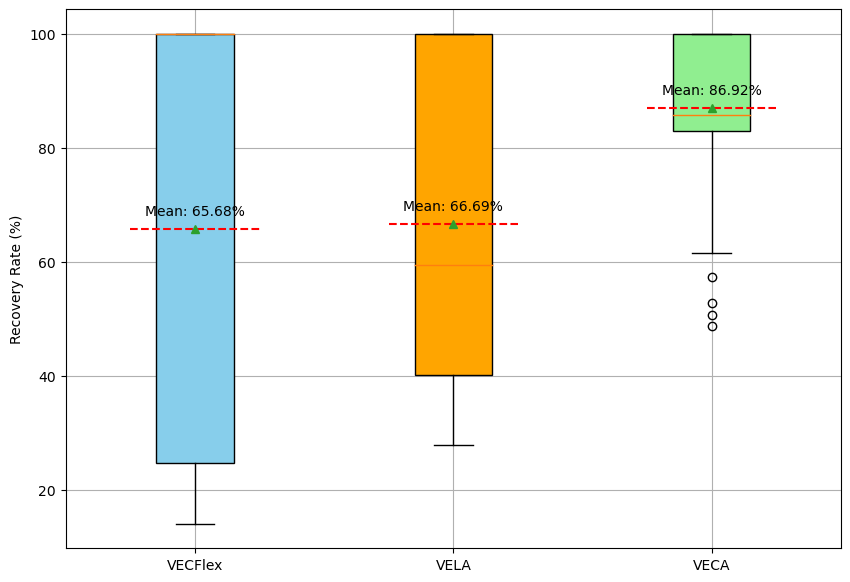

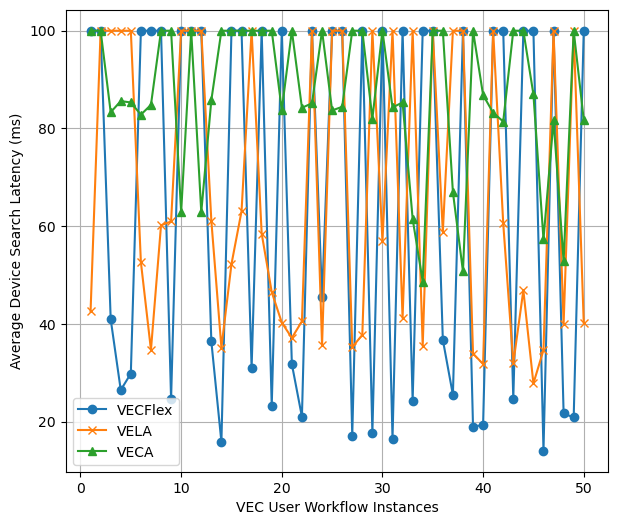

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data from CSV file
data = pd.read_csv('RecoveryRate.csv')

# Extract columns for plotting
instances = data['Instance']
pso_latencies = data['PSO']
vela_latencies = data['VELA']
veca_latencies = data['VECA']



# Calculate means for each approach
means = [np.mean(data['PSO']), np.mean(data['VELA']), np.mean(data['VECA'])]

# Preparing data for boxplot
data_to_plot = [data['PSO'], data['VELA'], data['VECA']]
labels = ['VECFlex', 'VELA', 'VECA']

# Create the boxplot with annotations
fig, ax = plt.subplots(figsize=(10, 7))
bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, showmeans=True)

# Color each box differently for clarity
colors = ['skyblue', 'orange', 'lightgreen']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# Draw a line for the mean value of each approach
for i, mean in enumerate(means, start=1):
    ax.hlines(mean, i - 0.25, i + 0.25, color='red', linestyle='--')

# Annotations to explain the mean lines and differences
ax.annotate(f'Mean: {means[0]:.2f}%', (1, means[0]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[1]:.2f}%', (2, means[1]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[2]:.2f}%', (3, means[2]), textcoords="offset points", xytext=(0,10), ha='center')

# Titles and labels
# plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.ylabel('Recovery Rate (%)')
plt.grid(True)

# Save and show plot
plt.savefig('boxplot_recovery_rate.png')
plt.show()

# Plotting
plt.figure(figsize=(7, 6))
plt.plot(instances, pso_latencies, label='VECFlex', marker='o')
plt.plot(instances, vela_latencies, label='VELA', marker='x')
plt.plot(instances, veca_latencies, label='VECA', marker='^')
plt.xlabel('VEC User Workflow Instances')
plt.ylabel('Average Device Search Latency (ms)')
# plt.title('Device Search Latency Across Workflow Instances')
plt.legend()
plt.grid(True)
plt.savefig('latency_plot.png')  # Saves the plot as a PNG file. You can choose PDF, SVG, PNG, EPS, etc.
plt.show()


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import time

# Constants
N_WORKFLOWS = 500  # Number of different workflow instances
N_CLUSTERS = 5
N_NODES_PER_CLUSTER = 100
TOTAL_NODES = N_CLUSTERS * N_NODES_PER_CLUSTER
RECOVERY_OVERHEAD_PSO = 15  # In milliseconds, overhead for restarting scheduling
RECOVERY_OVERHEAD_VELA = 10  # Overhead for VELA due to reduced scope
RECOVERY_OVERHEAD_VECA = 10  # VECA's recovery is quicker due to governance mechanism

# Simulation function
def simulate_recovery(cluster_approach, overhead):
    if cluster_approach == 'PSO':
        recovery_time = np.random.uniform(overhead, overhead * 5)
    elif cluster_approach == 'VELA':
        recovery_time = np.random.uniform(overhead, overhead * 2)
    elif cluster_approach == 'VECA':
        recovery_time = overhead  # VECA has a constant recovery overhead due to governance mechanism
    return recovery_time

# Simulating the workflow execution and recovery for each approach
def simulate_workflow(cluster_approach):
    print("Simulations")
    #execution_time = np.random.uniform(100, 200) 
#     execute_pasml()
    start_time = time.time()
#     execute_pasml()
    sleep()
    # Stop the timer
    end_time = time.time()
    # Calculate the elapsed time in milliseconds
    execution_time = (end_time - start_time) * 1000
    if np.random.random() < 0.50:  # 30% chance of failure
        recovery_time = simulate_recovery(cluster_approach, RECOVERY_OVERHEAD_PSO if cluster_approach == 'PSO' else
                                          RECOVERY_OVERHEAD_VELA if cluster_approach == 'VELA' else
                                          RECOVERY_OVERHEAD_VECA)
        total_time = execution_time + recovery_time
    else:
        recovery_time = 0
        total_time = execution_time
    return recovery_time, total_time

# Running the simulation
recovery_times = {'PSO': [], 'VELA': [], 'VECA': []}
total_times = {'PSO': [], 'VELA': [], 'VECA': []}

for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        print("Iteration ", i)
        print("Approach ", approach)
        recovery, total = simulate_workflow(approach)
        recovery_times[approach].append(recovery)
        total_times[approach].append(total)

# Calculating the recovery rates for each workflow instance
recovery_rates = {approach: [] for approach in recovery_times.keys()}
for i in range(N_WORKFLOWS):
    for approach in recovery_times.keys():
        recovery_rate = (1 - recovery_times[approach][i] / total_times[approach][i]) * 100
        recovery_rates[approach].append(recovery_rate)

# Preparing data for boxplot
data_to_plot = [recovery_rates['PSO'], recovery_rates['VELA'], recovery_rates['VECA']]
labels = ['PSO', 'VELA', 'VECA']

# Assuming you have already calculated recovery_rates for 'PSO', 'VELA', 'VECA'

# Calculate means for each approach
means = [np.mean(recovery_rates['PSO']), np.mean(recovery_rates['VELA']), np.mean(recovery_rates['VECA'])]

# Create the boxplot with annotations
fig, ax = plt.subplots(figsize=(10, 7))
bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, showmeans=True)

# Color each box differently for clarity
colors = ['skyblue', 'orange', 'lightgreen']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# Draw a line for the mean value of each approach
for i, mean in enumerate(means, start=1):
    ax.hlines(mean, i - 0.25, i + 0.25, color='red', linestyle='--')

# Annotations to explain the mean lines and differences
ax.annotate(f'Mean: {means[0]:.2f}%', (1, means[0]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[1]:.2f}%', (2, means[1]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[2]:.2f}%', (3, means[2]), textcoords="offset points", xytext=(0,10), ha='center')

# Titles and labels
plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.ylabel('Recovery Rate (%)')
plt.grid(True)

# Save and show plot
plt.savefig('boxplot_recovery_rate.png')
plt.show()



Iteration  0
Approach  PSO
Simulations


NameError: name 'execute_pasml' is not defined

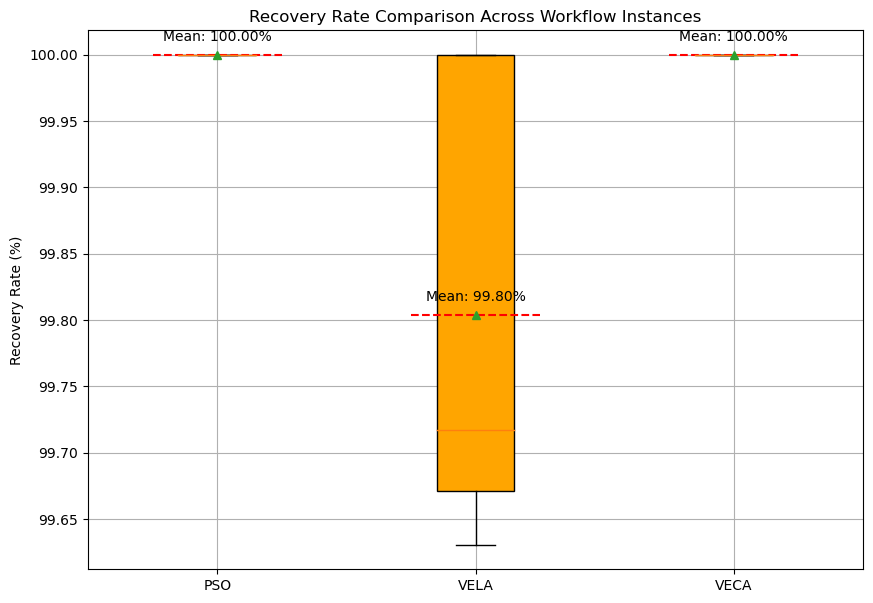

In [4]:
# Preparing data for boxplot
data_to_plot = [recovery_rates['PSO'], recovery_rates['VELA'], recovery_rates['VECA']]
labels = ['PSO', 'VELA', 'VECA']

# Assuming you have already calculated recovery_rates for 'PSO', 'VELA', 'VECA'

# Calculate means for each approach
means = [np.mean(recovery_rates['PSO']), np.mean(recovery_rates['VELA']), np.mean(recovery_rates['VECA'])]

# Create the boxplot with annotations
fig, ax = plt.subplots(figsize=(10, 7))
bp = ax.boxplot(data_to_plot, labels=labels, patch_artist=True, showmeans=True)

# Color each box differently for clarity
colors = ['skyblue', 'orange', 'lightgreen']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# Draw a line for the mean value of each approach
for i, mean in enumerate(means, start=1):
    ax.hlines(mean, i - 0.25, i + 0.25, color='red', linestyle='--')

# Annotations to explain the mean lines and differences
ax.annotate(f'Mean: {means[0]:.2f}%', (1, means[0]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[1]:.2f}%', (2, means[1]), textcoords="offset points", xytext=(0,10), ha='center')
ax.annotate(f'Mean: {means[2]:.2f}%', (3, means[2]), textcoords="offset points", xytext=(0,10), ha='center')

# Titles and labels
plt.title('Recovery Rate Comparison Across Workflow Instances')
plt.ylabel('Recovery Rate (%)')
plt.grid(True)

# Save and show plot
plt.savefig('boxplot_recovery_rate.png')
plt.show()

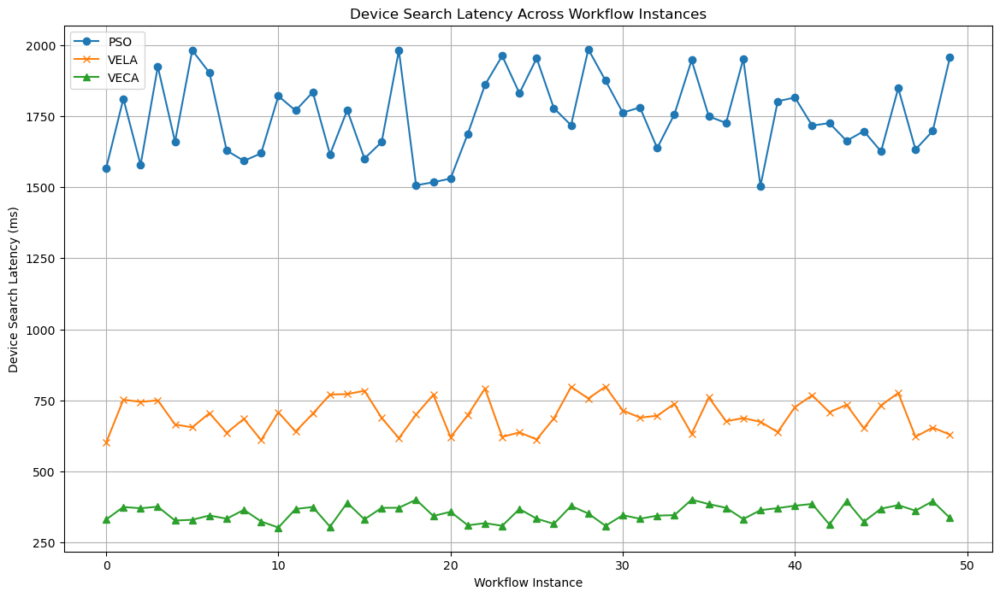

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Function to simulate cluster selection time
def select_cluster(approach):
    # Here you can plug in your specific logic for cluster selection
    if approach in ['VELA', 'VECA']:
        # Randomizing time between 1 to 3 milliseconds for cluster selection
        return np.random.uniform(1, 3)
    else:
        # For PSO, there's no cluster selection so return 0
        return 0

# Function to simulate node selection time within a cluster
def select_node(approach, num_nodes):
    # Here you can plug in your specific logic for node selection
    # Randomizing time between 3 to 4 milliseconds for node selection
    return np.random.uniform(3, 4) * num_nodes

# Simulating search latency for a single workflow instance
def simulate_search_latency(approach, num_total_nodes, num_nodes_in_cluster):
    cluster_time = select_cluster(approach)
    if approach == 'PSO':
        node_time = select_node(approach, num_total_nodes)  # Consider all nodes
    else:
        # For VELA and VECA, consider nodes within the selected clusters
        node_time = select_node(approach, num_nodes_in_cluster)
    return cluster_time + node_time

# Define the total number of nodes and nodes per cluster
num_total_nodes = 500
num_nodes_in_cluster = 100  # Each cluster has 100 nodes

# Simulate for 50 workflow instances
num_workflow_instances = 50
latency_pso, latency_vela, latency_veca = [], [], []

for _ in range(num_workflow_instances):
    latency_pso.append(simulate_search_latency('PSO', num_total_nodes, num_nodes_in_cluster))
    # VELA randomly selects 2 clusters
    latency_vela.append(simulate_search_latency('VELA', num_total_nodes, num_nodes_in_cluster * 2))
    # VECA selects the nearest cluster based on capacity
    latency_veca.append(simulate_search_latency('VECA', num_total_nodes, num_nodes_in_cluster))

# Plotting
plt.figure(figsize=(14, 8))
plt.plot(latency_pso, label='PSO', marker='o')
plt.plot(latency_vela, label='VELA', marker='x')
plt.plot(latency_veca, label='VECA', marker='^')
plt.xlabel('Workflow Instance')
plt.ylabel('Device Search Latency (ms)')
plt.title('Device Search Latency Across Workflow Instances')
plt.legend()
plt.grid(True)
plt.show()
